# Radial in MEEP


In [1]:
import meep as mp
import numpy as np

filename = '../build/radial_array.npy'
rad_arr = np.load(filename)

amp_data_ex = rad_arr[0,:,:,:]
amp_data_ey = rad_arr[1,:,:,:]
amp_data_ez = rad_arr[2,:,:,:]

wvl = 0.636; # um

# Define the source center
source_center = mp.Vector3(0, 0, 0)

s = 2
resolution = 50
dpml = 0.3

cell_size = mp.Vector3(s, s, s)

boundary_layers = [mp.PML(thickness=dpml)]

# Define the source size (if needed, otherwise it defaults to a point source)
source_size = mp.Vector3(0, s, s)

# Create the sources for Ex, Ey, and Ez components
source_ex = mp.Source(
    src=mp.ContinuousSource(frequency=1.0/wvl),  
    component=mp.Ex,
    center=source_center,
    size=source_size,
    amp_data=amp_data_ex
)

source_ey = mp.Source(
    src=mp.ContinuousSource(frequency=1.0/wvl),  
    component=mp.Ey,
    center=source_center,
    size=source_size,
    amp_data=amp_data_ey
)

source_ez = mp.Source(
    src=mp.ContinuousSource(frequency=1.0/wvl),  
    component=mp.Ez,
    center=source_center,
    size=source_size,
    amp_data=amp_data_ez
)


# Create the simulation object
sim = mp.Simulation(
    cell_size=cell_size,
    sources=[source_ex, source_ey, source_ez],
    boundary_layers=boundary_layers,
    resolution=resolution
)


Using MPI version 4.1, 1 processes


In [35]:
# run simulation 
sim.run(until=2)

on time step 400 (time=4), 0.188033 s/step
Meep progress: 1.1000000000000005/6.0 = 18.3% done in 4.0s, 17.8s to go
on time step 511 (time=5.11), 0.0363441 s/step
run 2 finished at t = 6.0 (600 timesteps)


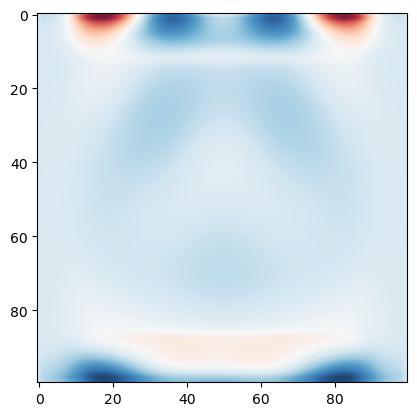

In [2]:

import matplotlib.pyplot as plt

figure1 = plt.figure()

volume=mp.Volume(size=mp.Vector3(0,s,s), center=mp.Vector3())

ez = sim.get_array(component=mp.Ez,vol=volume)

plt.imshow(ez.transpose(), interpolation='spline36', cmap='RdBu', alpha=0.9)

plt.savefig("rad_Ez.png", bbox_inches="tight", pad_inches=0, dpi=250)


In [11]:
import matplotlib.pyplot as plt

f = plt.figure(dpi=300)
volume=mp.Volume(size=mp.Vector3(0,s,s), center=mp.Vector3())

Animate_XY = mp.Animate2D(sim, fields=mp.Ez, f=f,output_plane=volume, realtime=False, normalize=True)
plt.close()

# Run 
vid_t = 0.3
sim.run(mp.at_every(vid_t,Animate_XY), until=15)
plt.close()


on time step 1500 (time=15), 3.78967 s/step


/home/tim/miniconda3/envs/pmp/lib/python3.11/site-packages/meep/visualization.py:1446: UserWarning: Warning: The 'sim' argument in Animate2D is deprecated and has no effect. It will be removed in a future release.
  warnings.warn(


Meep progress: 1.0199999999999996/30.0 = 3.4% done in 4.0s, 114.3s to go
on time step 1603 (time=16.03), 0.0391039 s/step
Meep progress: 2.120000000000001/30.0 = 7.1% done in 8.0s, 105.6s to go
on time step 1713 (time=17.13), 0.036532 s/step
Meep progress: 3.1700000000000017/30.0 = 10.6% done in 12.1s, 102.0s to go
on time step 1818 (time=18.18), 0.0381907 s/step
Meep progress: 4.210000000000001/30.0 = 14.0% done in 16.1s, 98.4s to go
on time step 1922 (time=19.22), 0.0391768 s/step
Meep progress: 5.25/30.0 = 17.5% done in 20.1s, 94.7s to go
on time step 2027 (time=20.27), 0.0381489 s/step
Meep progress: 6.309999999999999/30.0 = 21.0% done in 24.1s, 90.5s to go
on time step 2133 (time=21.33), 0.0379078 s/step
Meep progress: 7.23/30.0 = 24.1% done in 28.1s, 88.6s to go
on time step 2225 (time=22.25), 0.043507 s/step
Meep progress: 8.27/30.0 = 27.6% done in 32.2s, 84.5s to go
on time step 2328 (time=23.28), 0.038884 s/step
Meep progress: 9.280000000000001/30.0 = 30.9% done in 36.2s, 80.8

In [3]:
import matplotlib.pyplot as plt


# Create a figure with a high DPI
f = plt.figure(dpi=300)

# Define the volume for the animation
s = 16  # Example size, adjust as needed
volume = mp.Volume(size=mp.Vector3(0, s, s), center=mp.Vector3())

# Create the animation object
Animate_XY = mp.Animate2D(
    sim, 
    fields=mp.Ez, 
    f=f,
    output_plane=volume, 
    realtime=False, 
    normalize=True
)

plt.close(f)

# Run the simulation and save the animation
vid_t = 0.2
sim.run(mp.at_every(vid_t, Animate_XY), until=10)


-----------
Initializing structure...
time for choose_chunkdivision = 0.000701122 s
Working in 3D dimensions.
Computational cell is 2 x 2 x 2 with resolution 50
time for set_epsilon = 2.29007 s


/home/tim/miniconda3/envs/pmp/lib/python3.11/site-packages/meep/visualization.py:1446: UserWarning: Warning: The 'sim' argument in Animate2D is deprecated and has no effect. It will be removed in a future release.
  warnings.warn(


-----------
Meep progress: 0.18/15.0 = 1.2% done in 4.0s, 331.1s to go
on time step 18 (time=0.18), 0.223424 s/step


/home/tim/miniconda3/envs/pmp/lib/python3.11/site-packages/meep/visualization.py:284: UserWarning: The specified user volume is larger than the simulation domain and has been truncated.
  warnings.warn(


Meep progress: 1.34/15.0 = 8.9% done in 8.0s, 82.0s to go
on time step 134 (time=1.34), 0.0346412 s/step
Meep progress: 2.5100000000000002/15.0 = 16.7% done in 12.1s, 60.1s to go
on time step 251 (time=2.51), 0.0344326 s/step
Meep progress: 3.5700000000000003/15.0 = 23.8% done in 16.1s, 51.5s to go
on time step 357 (time=3.57), 0.0379646 s/step
Meep progress: 4.8/15.0 = 32.0% done in 20.1s, 42.7s to go
on time step 480 (time=4.8), 0.0325367 s/step
Meep progress: 5.98/15.0 = 39.9% done in 24.1s, 36.4s to go
on time step 598 (time=5.98), 0.0341165 s/step
Meep progress: 7.13/15.0 = 47.5% done in 28.1s, 31.1s to go
on time step 713 (time=7.13), 0.034978 s/step
Meep progress: 8.24/15.0 = 54.9% done in 32.2s, 26.4s to go
on time step 824 (time=8.24), 0.0361308 s/step
Meep progress: 9.370000000000001/15.0 = 62.5% done in 36.2s, 21.7s to go
on time step 937 (time=9.37), 0.0354386 s/step
Meep progress: 10.56/15.0 = 70.4% done in 40.2s, 16.9s to go
on time step 1056 (time=10.56), 0.0337269 s/ste

In [6]:
filename = "radial_Ez.mp4"
Animate_XY.to_mp4(5,filename)

Generating MP4...


In [4]:
Animate_XY.to_jshtml(5)